In [158]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.multioutput import MultiOutputClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score,precision_recall_curve, precision_score

In [159]:
genetics_df = pd.read_csv('train.csv')

In [160]:
genetics_df[:5]

,Patient Id,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Patient First Name,Family Name,Father's name,...,Birth defects,White Blood cell count (thousand per microliter),Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass
0,PID0x6418,2.0,Yes,No,Yes,No,4.760603,Richard,NaN,Larre,...,NaN,9.857562,NaN,1.0,1.0,1.0,1.0,1.0,Mitochondrial genetic inheritance disorders,Leber's hereditary optic neuropathy
1,PID0x25d5,4.0,Yes,Yes,No,No,4.910669,Mike,NaN,Brycen,...,Multiple,5.522560,normal,1.0,NaN,1.0,1.0,0.0,NaN,Cystic fibrosis
2,PID0x4a82,6.0,Yes,No,No,No,4.893297,Kimberly,NaN,Nashon,...,Singular,NaN,normal,0.0,1.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes
3,PID0x4ac8,12.0,Yes,No,Yes,No,4.705280,Jeffery,Hoelscher,Aayaan,...,Singular,7.919321,inconclusive,0.0,0.0,1.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome
4,PID0x1bf7,11.0,Yes,No,NaN,Yes,4.720703,Johanna,Stutzman,Suave,...,Multiple,4.098210,NaN,0.0,0.0,0.0,0.0,NaN,Multifactorial genetic inheritance disorders,Cancer


In [161]:
genetics_df.columns

Index(['Patient Id', 'Patient Age', 'Genes in mother's side',
       'Inherited from father', 'Maternal gene', 'Paternal gene',
       'Blood cell count (mcL)', 'Patient First Name', 'Family Name',
       'Father's name', 'Mother's age', 'Father's age', 'Institute Name',
       'Location of Institute', 'Status', 'Respiratory Rate (breaths/min)',
       'Heart Rate (rates/min', 'Test 1', 'Test 2', 'Test 3', 'Test 4',
       'Test 5', 'Parental consent', 'Follow-up', 'Gender', 'Birth asphyxia',
       'Autopsy shows birth defect (if applicable)', 'Place of birth',
       'Folic acid details (peri-conceptional)',
       'H/O serious maternal illness', 'H/O radiation exposure (x-ray)',
       'H/O substance abuse', 'Assisted conception IVF/ART',
       'History of anomalies in previous pregnancies',
       'No. of previous abortion', 'Birth defects',
       'White Blood cell count (thousand per microliter)', 'Blood test result',
       'Symptom 1', 'Symptom 2', 'Symptom 3', 'Symptom 4', 'S

In [162]:
genetics_df['Genetic Disorder'].value_counts()

Mitochondrial genetic inheritance disorders     10202
Single-gene inheritance diseases                 7664
Multifactorial genetic inheritance disorders     2071
Name: Genetic Disorder, dtype: int64

In [163]:
nan_counts = genetics_df.isna().sum()
nan_counts

Patient Id                                             0
Patient Age                                         1427
Genes in mother's side                                 0
Inherited from father                                306
Maternal gene                                       2810
Paternal gene                                          0
Blood cell count (mcL)                                 0
Patient First Name                                     0
Family Name                                         9691
Father's name                                          0
Mother's age                                        6036
Father's age                                        5986
Institute Name                                      5106
Location of Institute                                  0
Status                                                 0
Respiratory Rate (breaths/min)                      2149
Heart Rate (rates/min                               2113
Test 1                         

In [164]:
genetics_df.shape

(22083, 45)

In [165]:
genetics_df.dropna(subset=["Genetic Disorder", "Disorder Subclass"], inplace=True)

In [166]:
genetics_df["Mother's age"].unique()

array([nan, 41., 21., 32., 40., 45., 44., 50., 30., 24., 36., 51., 23.,
       49., 46., 18., 38., 37., 42., 48., 28., 25., 19., 47., 34., 35.,
       22., 33., 20., 29., 26., 31., 27., 43., 39.])

In [167]:
bins = [0, 31, 41, 51]
labels = [1,2,3]
genetics_df["mother's_age_binned"] = pd.cut(genetics_df["Mother's age"], bins=bins, labels=labels)

In [168]:
genetics_df["Father's age"].unique()

array([nan, 22., 63., 44., 42., 56., 20., 24., 57., 48., 30., 55., 62.,
       32., 41., 52., 28., 31., 61., 35., 49., 50., 23., 29., 64., 39.,
       34., 51., 25., 43., 60., 53., 58., 26., 27., 59., 38., 47., 54.,
       21., 37., 36., 46., 40., 45., 33.])

In [169]:
bins = [0, 31, 41, 51, 65]
labels = [1,2,3,4]
genetics_df["father's_age_binned"] = pd.cut(genetics_df["Father's age"], bins=bins, labels=labels)

In [170]:
del genetics_df["Mother's age"]
del genetics_df["Father's age"]

In [171]:
genetics_df.head()

,Patient Id,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Patient First Name,Family Name,Father's name,...,Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass,mother's_age_binned,father's_age_binned
0,PID0x6418,2.0,Yes,No,Yes,No,4.760603,Richard,NaN,Larre,...,NaN,1.0,1.0,1.0,1.0,1.0,Mitochondrial genetic inheritance disorders,Leber's hereditary optic neuropathy,NaN,NaN
2,PID0x4a82,6.0,Yes,No,No,No,4.893297,Kimberly,NaN,Nashon,...,normal,0.0,1.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes,2,1
3,PID0x4ac8,12.0,Yes,No,Yes,No,4.705280,Jeffery,Hoelscher,Aayaan,...,inconclusive,0.0,0.0,1.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome,1,NaN
4,PID0x1bf7,11.0,Yes,No,NaN,Yes,4.720703,Johanna,Stutzman,Suave,...,NaN,0.0,0.0,0.0,0.0,NaN,Multifactorial genetic inheritance disorders,Cancer,2,NaN
5,PID0x44fe,14.0,Yes,No,Yes,No,5.103188,Richard,NaN,Coleston,...,normal,1.0,0.0,0.0,1.0,0.0,Single-gene inheritance diseases,Cystic fibrosis,NaN,NaN


In [172]:
genetics_df = genetics_df.drop(columns=["Patient Id",'Patient First Name', 'Test 1','Test 2','Test 3','Test 4','Test 5','Family Name',"Father's name", 'Location of Institute','Institute Name'])

In [173]:
genetics_df["Patient Age"].unique()

array([ 2.,  6., 12., 11., 14.,  3.,  4.,  7.,  1.,  0., nan, 10.,  5.,
        8.,  9., 13.])

In [174]:
genetics_df.shape

(18047, 34)

In [175]:
genetics_df.columns

Index(['Patient Age', 'Genes in mother's side', 'Inherited from father',
       'Maternal gene', 'Paternal gene', 'Blood cell count (mcL)', 'Status',
       'Respiratory Rate (breaths/min)', 'Heart Rate (rates/min',
       'Parental consent', 'Follow-up', 'Gender', 'Birth asphyxia',
       'Autopsy shows birth defect (if applicable)', 'Place of birth',
       'Folic acid details (peri-conceptional)',
       'H/O serious maternal illness', 'H/O radiation exposure (x-ray)',
       'H/O substance abuse', 'Assisted conception IVF/ART',
       'History of anomalies in previous pregnancies',
       'No. of previous abortion', 'Birth defects',
       'White Blood cell count (thousand per microliter)', 'Blood test result',
       'Symptom 1', 'Symptom 2', 'Symptom 3', 'Symptom 4', 'Symptom 5',
       'Genetic Disorder', 'Disorder Subclass', 'mother's_age_binned',
       'father's_age_binned'],
      dtype='object')

In [176]:
nan_counts = genetics_df.isna().sum()
nan_counts

Patient Age                                         1060
Genes in mother's side                                 0
Inherited from father                                220
Maternal gene                                       2071
Paternal gene                                          0
Blood cell count (mcL)                                 0
Status                                                 0
Respiratory Rate (breaths/min)                      1570
Heart Rate (rates/min                               1528
Parental consent                                    1579
Follow-up                                           1575
Gender                                              1573
Birth asphyxia                                      1552
Autopsy shows birth defect (if applicable)           757
Place of birth                                      1591
Folic acid details (peri-conceptional)              1564
H/O serious maternal illness                        1552
H/O radiation exposure (x-ray) 

In [177]:
genetics_df = genetics_df.dropna(axis=0)

In [178]:
genetics_df.shape

(6815, 34)

In [179]:
replace_map = {"No": 0, "Yes": 1}

# Apply the replacement to the specified columns
columns_to_replace = ["Genes in mother's side", "Inherited from father", "Maternal gene", "Paternal gene"]
genetics_df[columns_to_replace] = genetics_df[columns_to_replace].replace(replace_map)

<ipython-input-179-71fb7f6c3ade>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genetics_df[columns_to_replace] = genetics_df[columns_to_replace].replace(replace_map)


In [180]:
genetics_df.head()

,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),Status,Respiratory Rate (breaths/min),Heart Rate (rates/min,Parental consent,...,Blood test result,Symptom 1,Symptom 2,Symptom 3,Symptom 4,Symptom 5,Genetic Disorder,Disorder Subclass,mother's_age_binned,father's_age_binned
8,11.0,0,0,1,0,5.209058,Alive,Tachypnea,Tachycardia,Yes,...,slightly abnormal,1.0,1.0,1.0,0.0,1.0,Mitochondrial genetic inheritance disorders,Leigh syndrome,3,3
9,4.0,0,1,1,1,4.752272,Alive,Tachypnea,Tachycardia,Yes,...,abnormal,0.0,0.0,1.0,1.0,1.0,Multifactorial genetic inheritance disorders,Diabetes,3,3
12,1.0,1,1,0,0,4.612265,Deceased,Normal (30-60),Tachycardia,Yes,...,slightly abnormal,1.0,1.0,0.0,1.0,0.0,Mitochondrial genetic inheritance disorders,Leigh syndrome,3,4
14,6.0,1,0,1,0,4.620420,Alive,Tachypnea,Tachycardia,Yes,...,slightly abnormal,1.0,0.0,1.0,0.0,1.0,Mitochondrial genetic inheritance disorders,Leigh syndrome,2,1
18,10.0,1,1,1,0,4.751452,Deceased,Normal (30-60),Tachycardia,Yes,...,abnormal,1.0,1.0,0.0,0.0,0.0,Mitochondrial genetic inheritance disorders,Mitochondrial myopathy,2,4


In [181]:
correlation_matrix = genetics_df.corr()

<ipython-input-181-7774efa3fdf5>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = genetics_df.corr()


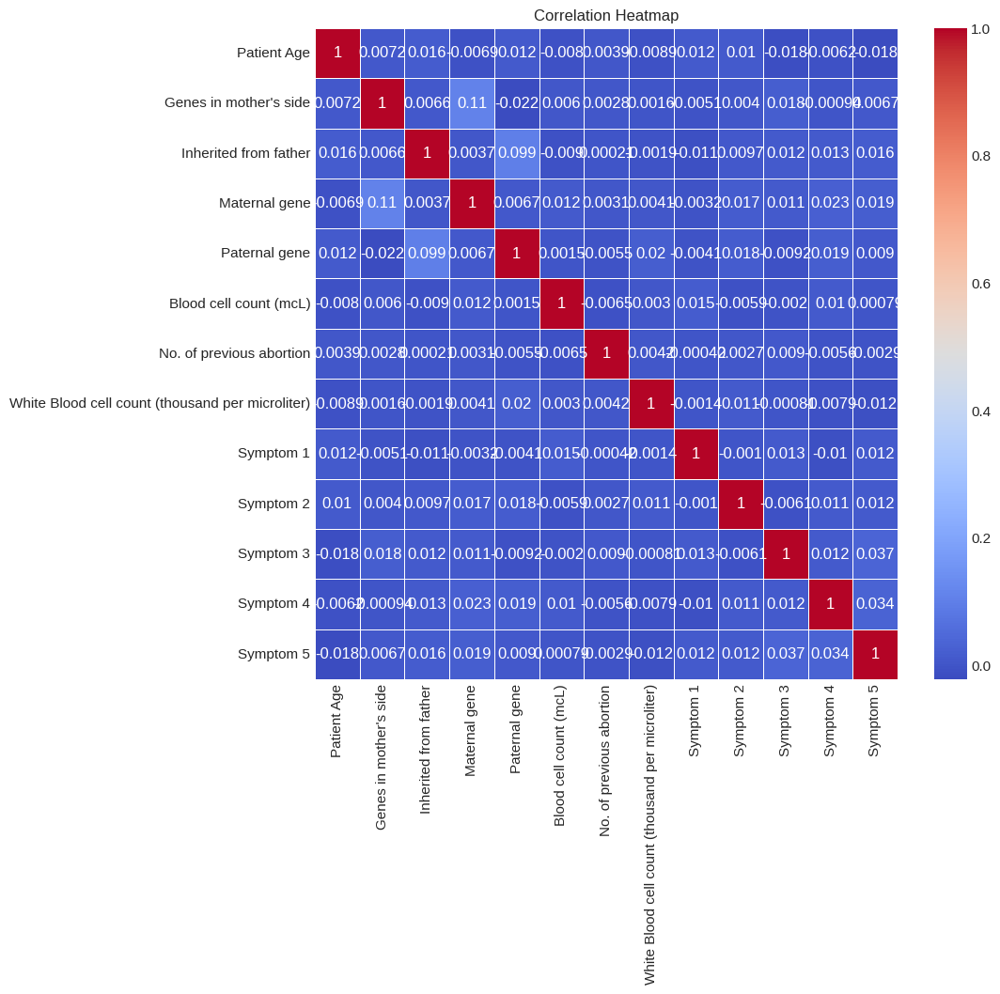

In [182]:
plt.figure(figsize=(10, 9))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

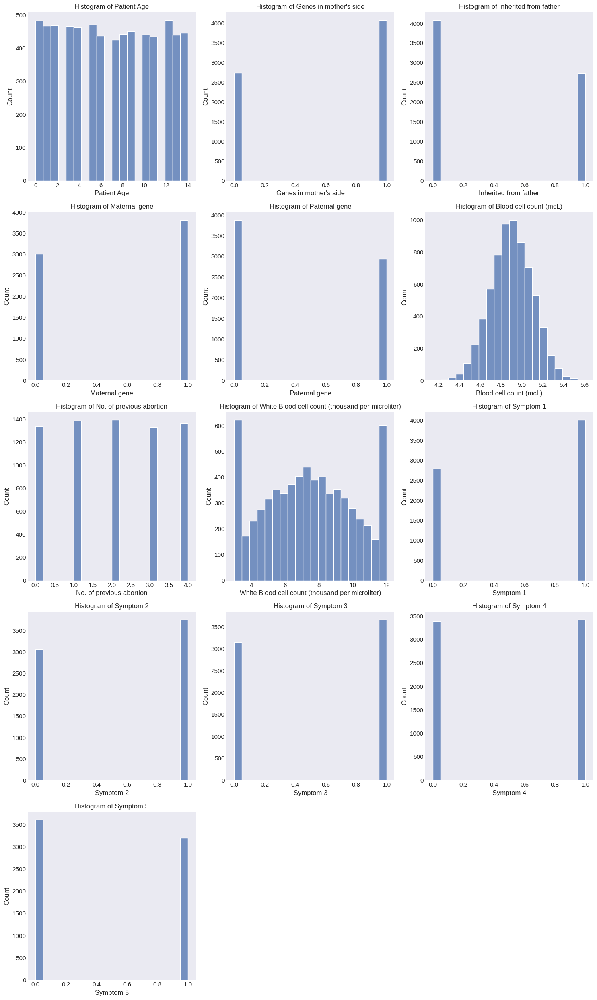

In [183]:
numerical_features = genetics_df.select_dtypes(include=['int64', 'float64'])

# Determine the number of features and rows/columns for subplots
num_features = len(numerical_features.columns)
num_cols = 3  # Number of columns for subplots (adjust as needed)
num_rows = (num_features - 1) // num_cols + 1  # Calculate the number of rows

# Set the figure size
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

# Create histograms for numerical features
for i, feature in enumerate(numerical_features.columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    sns.histplot(data=genetics_df, x=feature, ax=axes[row_idx, col_idx,], bins=20)
    axes[row_idx, col_idx].set_title(f'Histogram of {feature}')

# Remove empty subplots
for i in range(num_features, num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout
plt.tight_layout()
plt.show()

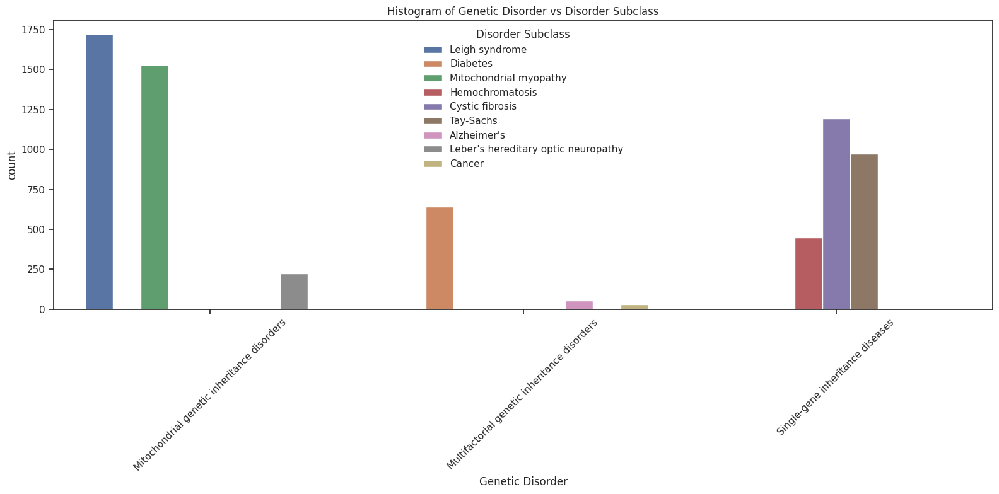

In [184]:
plt.figure(figsize=(16, 8))

# Create a countplot for the link between "Genetic Disorder" and "Disorder Subclass"
sns.set(style="ticks")
sns.countplot(data=genetics_df, x="Genetic Disorder", hue="Disorder Subclass")
plt.title("Histogram of Genetic Disorder vs Disorder Subclass")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()


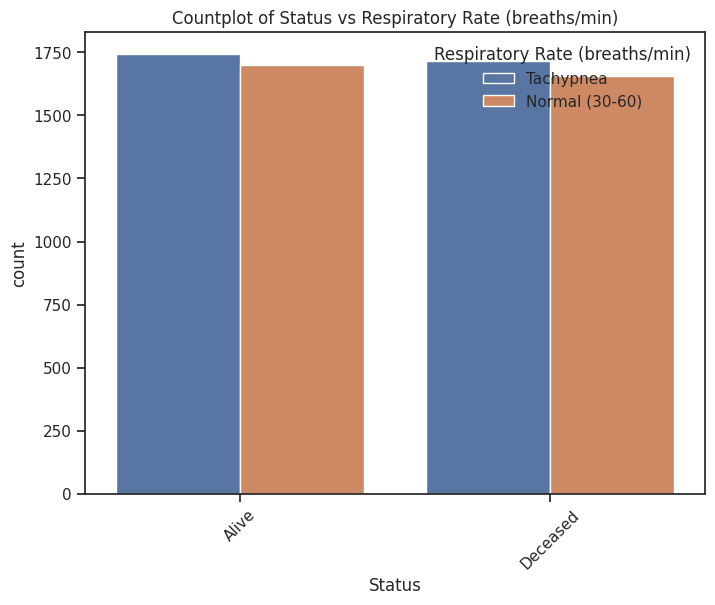

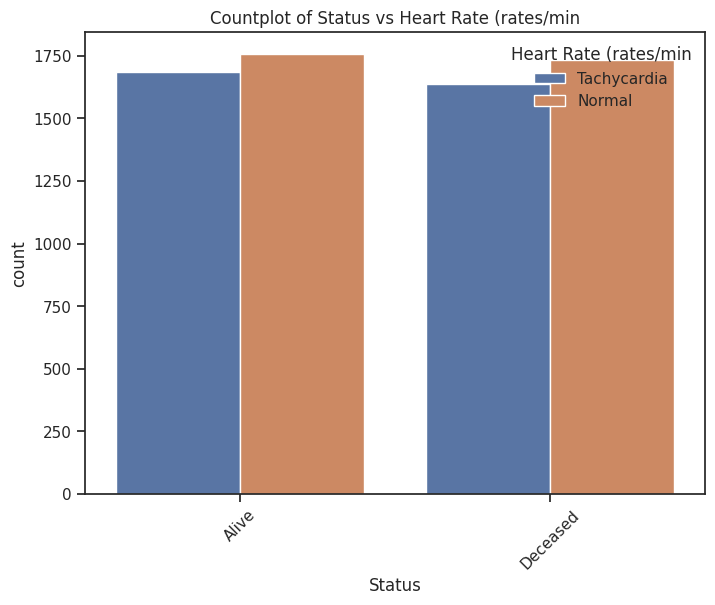

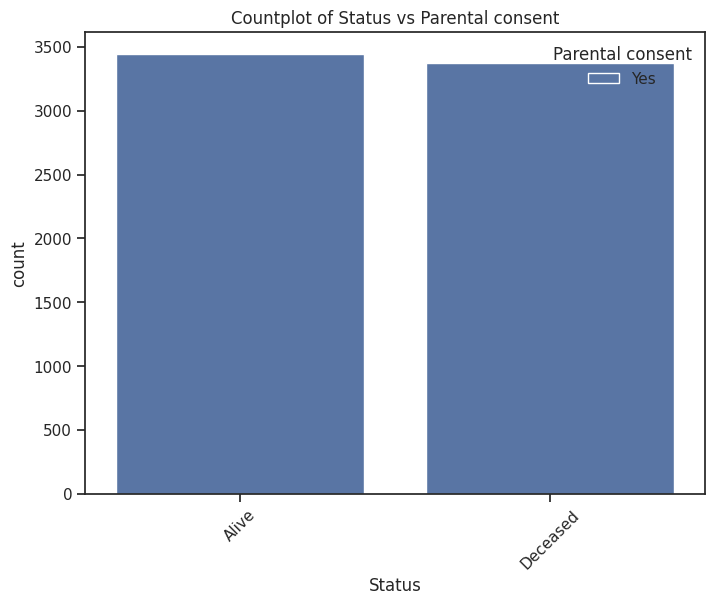

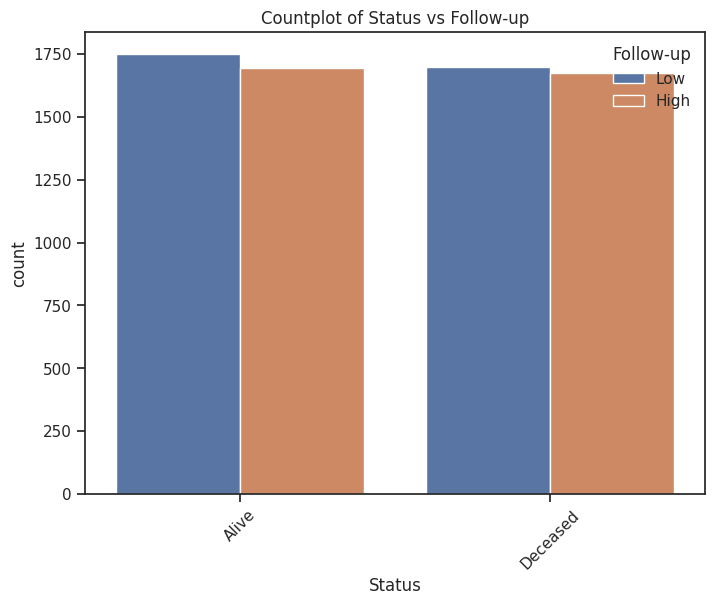

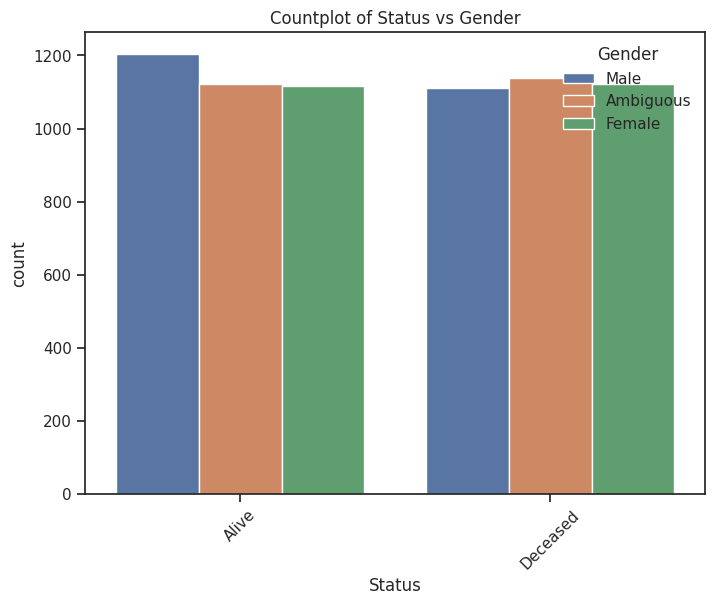

...

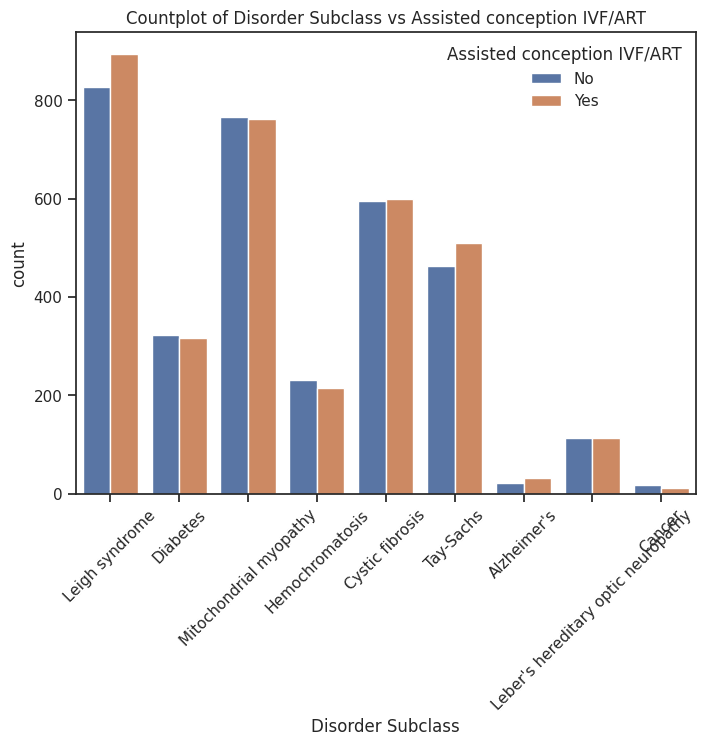

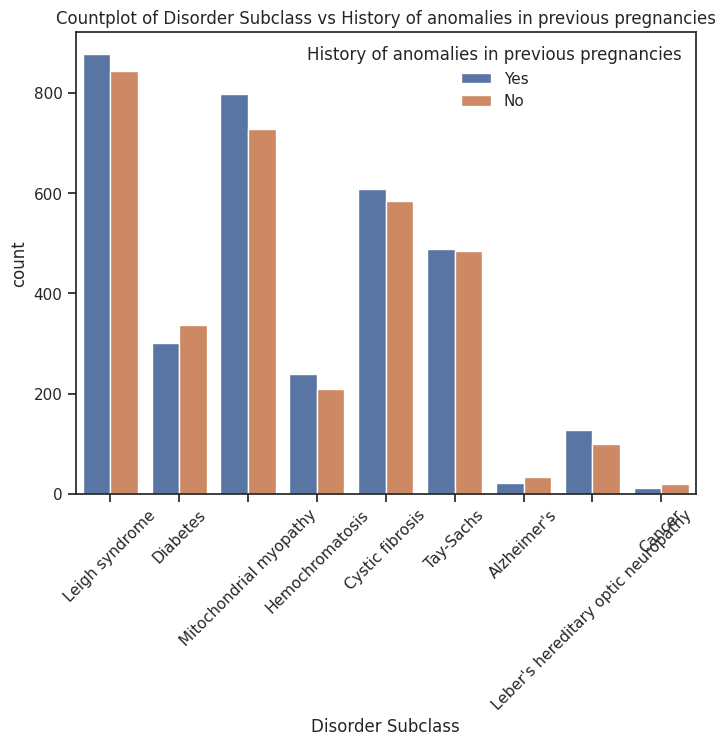

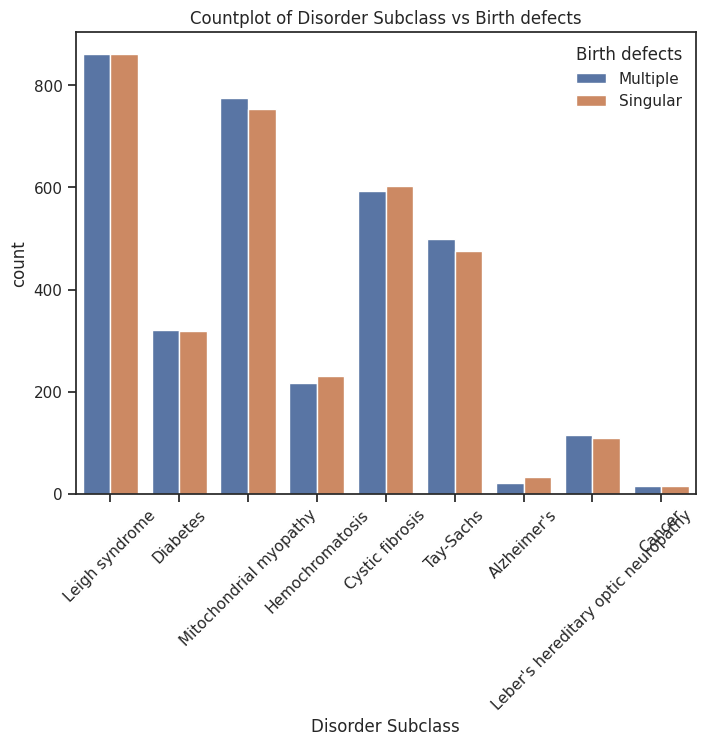

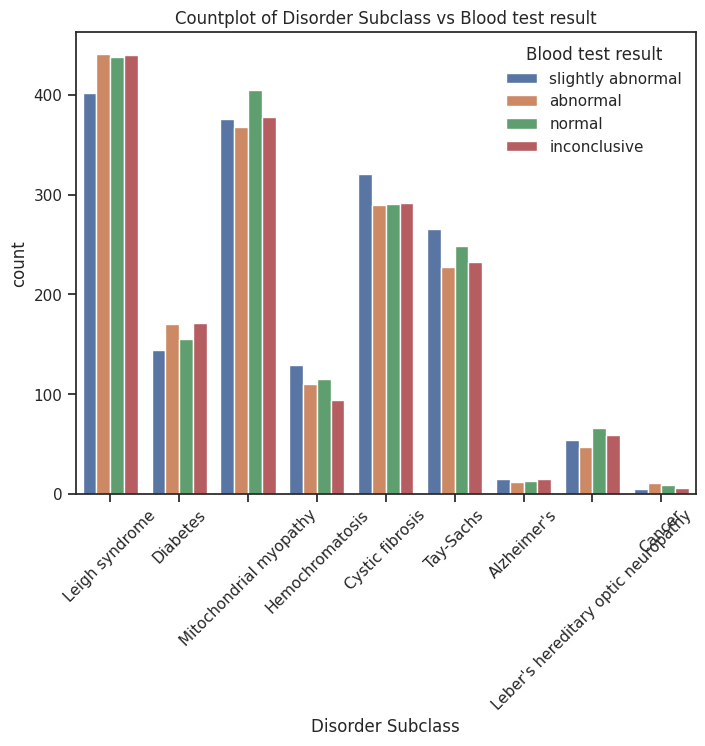

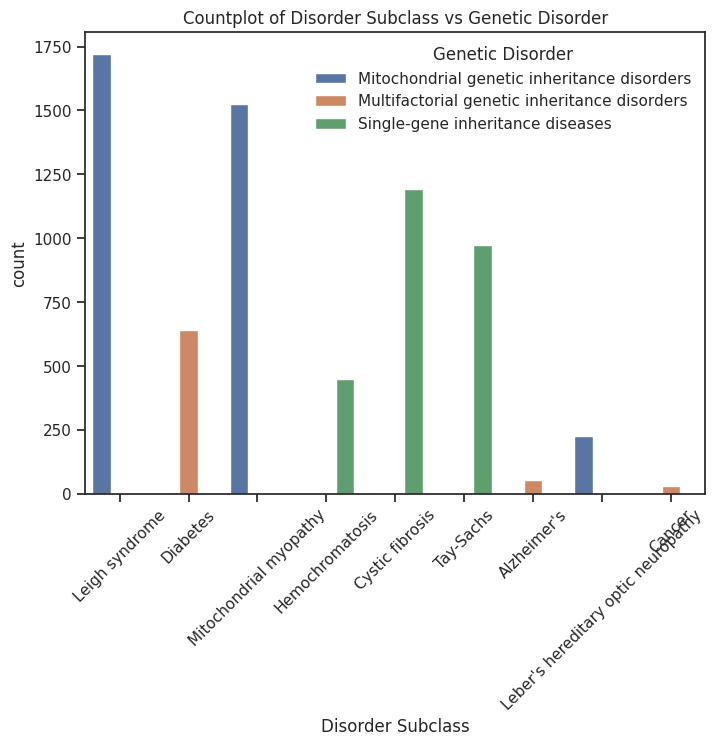

In [185]:
categorical_features = genetics_df.select_dtypes(include=['object'])

# Create bar graphs for each combination of categorical variables
sns.set(style="ticks")
for feature1 in categorical_features:
    for feature2 in categorical_features:
        if feature1 != feature2:
            plt.figure(figsize=(8, 6))
            sns.countplot(data=genetics_df, x=feature1, hue=feature2)
            plt.title(f'Countplot of {feature1} vs {feature2}')
            plt.xticks(rotation=45)
            plt.show()

<ipython-input-186-3266c22fb74e>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


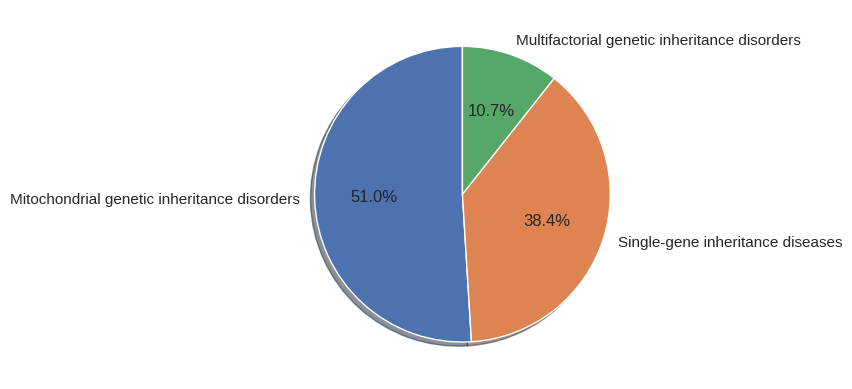

In [186]:
labels1 = 'Mitochondrial genetic inheritance disorders', 'Single-gene inheritance diseases', 'Multifactorial genetic inheritance disorders'
explode1 = (0, 0, 0)

plt.style.use('seaborn-dark')
plt.pie(genetics_df['Genetic Disorder'].value_counts(), explode=explode1, labels=labels1, autopct='%1.1f%%',
        shadow=True, startangle=90);

<ipython-input-187-d5e6bc798531>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


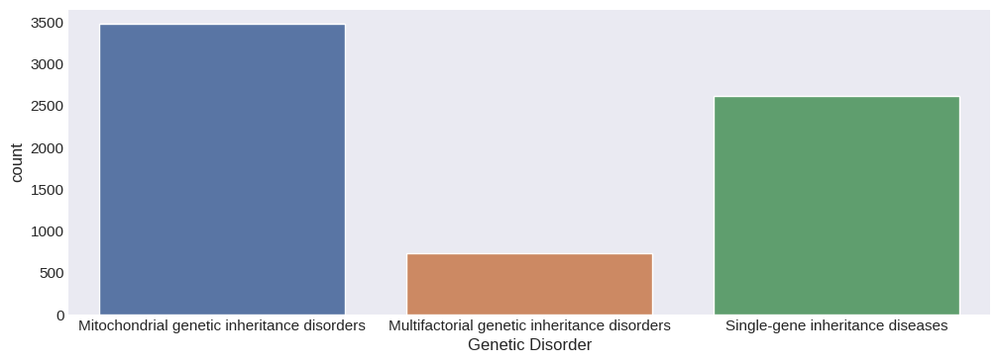

In [187]:
plt.style.use('seaborn-dark')
plt.figure(figsize=(12, 4))
sns.countplot(x = 'Genetic Disorder', data = genetics_df);

<ipython-input-188-a905f3377e22>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-dark')


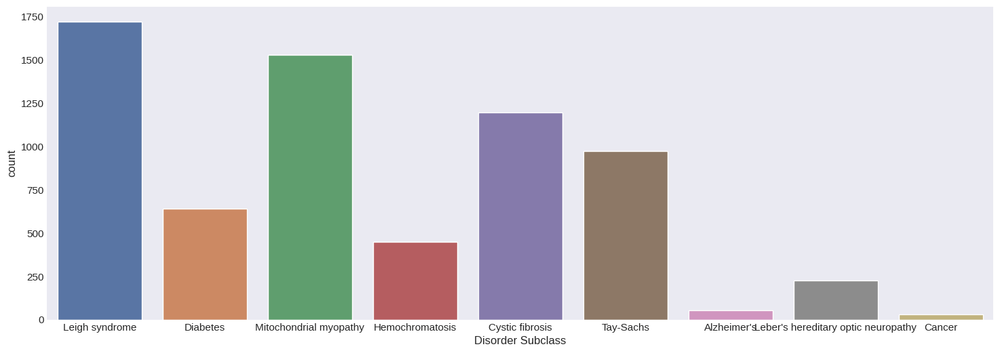

In [188]:
plt.style.use('seaborn-dark')
plt.figure(figsize=(18, 6))
sns.countplot(x = 'Disorder Subclass', data = genetics_df);

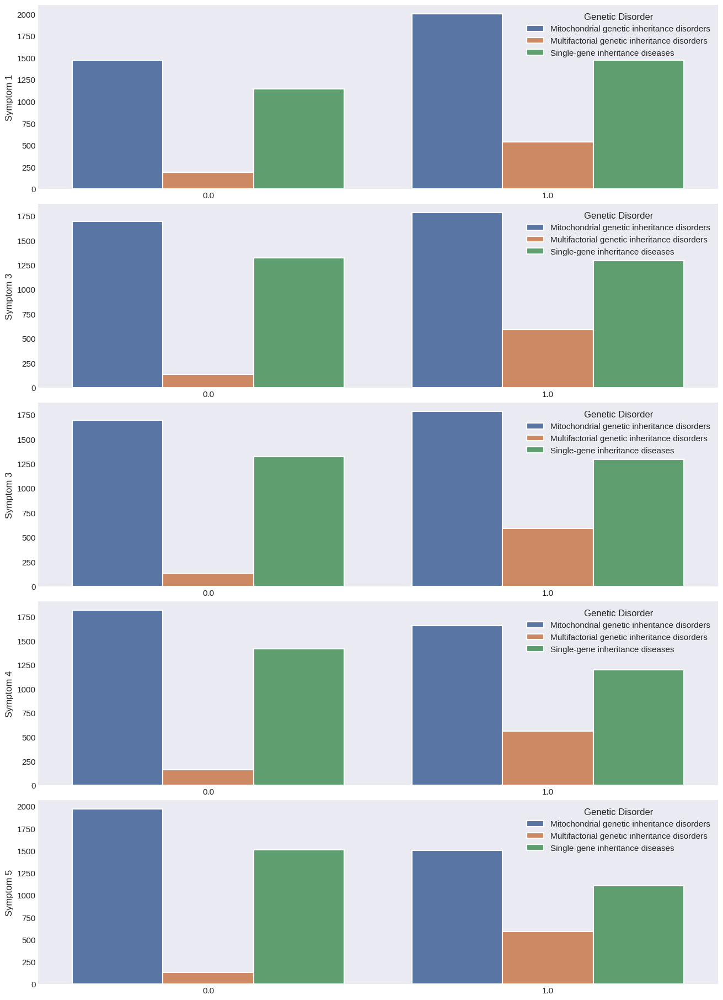

In [189]:
symptom  = ['Symptom 1', 'Symptom 3', 'Symptom 3', 'Symptom 4', 'Symptom 5']

fig, ax = plt.subplots(len(symptom),  figsize = (13, 18), constrained_layout = True)

for i, var in enumerate(symptom):
    sns.countplot(data = genetics_df, x = var, hue = 'Genetic Disorder', ax = ax[i], linewidth = 1.5)
    ax[i].set_ylabel(var)
    ax[i].set_xlabel(None)

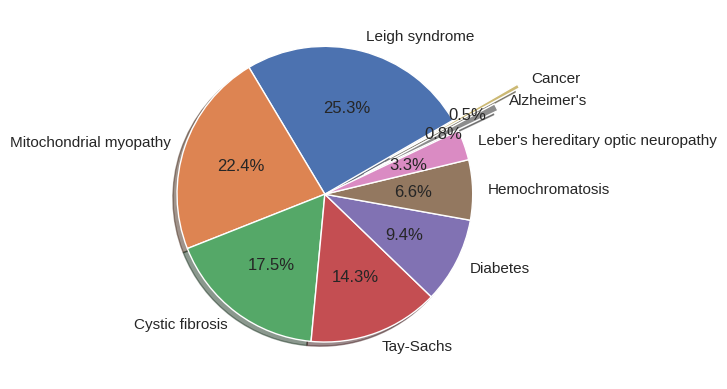

In [190]:
#visualizing in Pie chart
labels2 = 'Leigh syndrome', 'Mitochondrial myopathy', 'Cystic fibrosis', 'Tay-Sachs', 'Diabetes', 'Hemochromatosis', "Leber's hereditary optic neuropathy", "Alzheimer's", 'Cancer'
explode2 = (0, 0, 0, 0, 0, 0, 0, 0.3, 0.5)

plt.pie(genetics_df['Disorder Subclass'].value_counts(), explode=explode2, labels=labels2, autopct='%1.1f%%',
        shadow=True, startangle=30);

In [191]:
label_encoder = LabelEncoder()

genetics_df['Genetic Disorder'] = label_encoder.fit_transform(genetics_df['Genetic Disorder'])

genetics_df['Disorder Subclass'] = label_encoder.fit_transform(genetics_df['Disorder Subclass'])

<ipython-input-192-fa8394123473>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = genetics_df.corr()


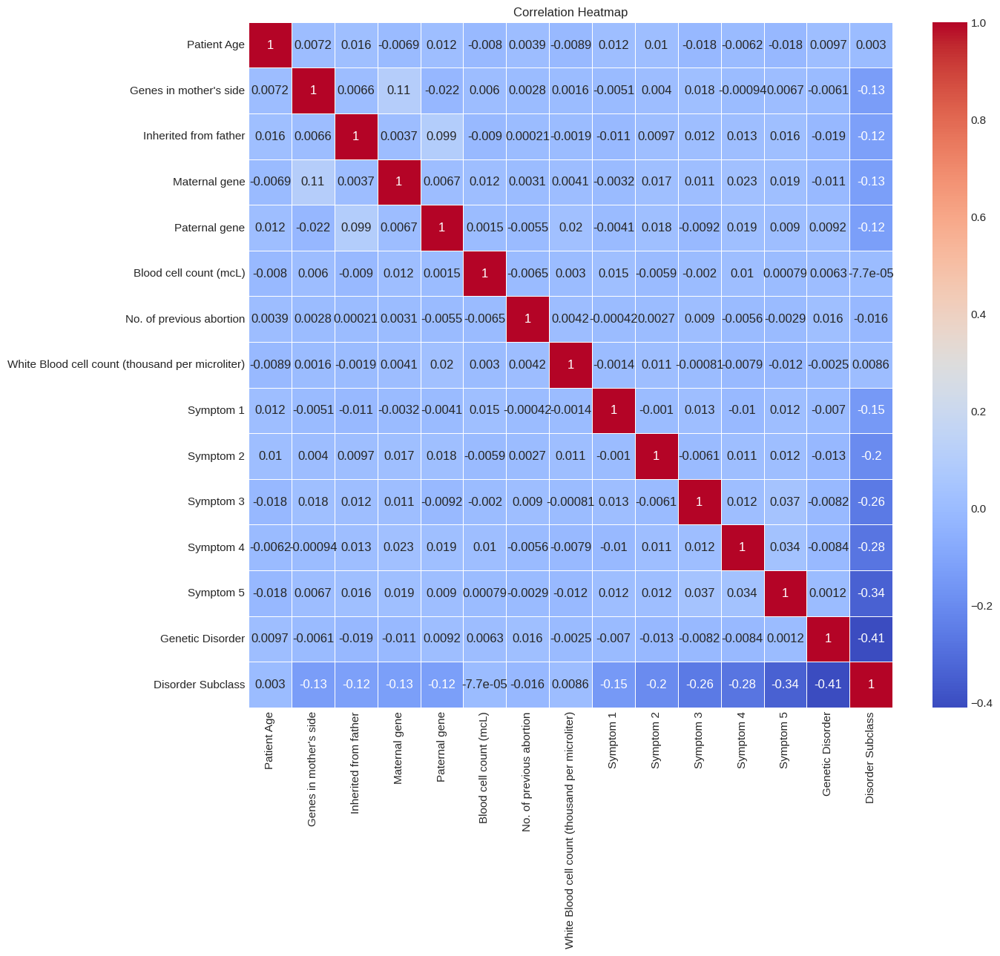

In [192]:
correlation_matrix = genetics_df.corr()
plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [193]:
'''X = genetics_df.drop('Disorder Subclass', axis = 1)
y = genetics_df['Disorder Subclass']

X_train, X_test, y_train, y_test = train_test_split(X.values, y.values, stratify = y, test_size = 0.3, random_state = 123)'''

"X = genetics_df.drop('Disorder Subclass', axis = 1)\ny = genetics_df['Disorder Subclass']\n\nX_train, X_test, y_train, y_test = train_test_split(X.values, y.values, stratify = y, test_size = 0.3, random_state = 123)"

###Cross-Validation

In [194]:
y = genetics_df[['Genetic Disorder', 'Disorder Subclass']]
X = genetics_df[genetics_df.columns.difference(['Genetic Disorder', 'Disorder Subclass'])]


train_df, val_df = train_test_split(genetics_df, test_size=0.3, random_state=42)

In [195]:
df_numerical = train_df.select_dtypes(exclude=['object']).copy()
df_objects = train_df.select_dtypes(include=['object']).copy()

In [196]:
scaler = StandardScaler()
numerical_array = scaler.fit_transform(df_numerical.values)
df_numerical_scaled = pd.DataFrame(numerical_array, index=df_numerical.index, columns=df_numerical.columns)

In [197]:
df_objects_encoded = pd.get_dummies(df_objects)

In [198]:
df_scaled_encoded = pd.concat([df_numerical_scaled, df_objects_encoded], axis=1)

In [199]:
df_objects.isna().sum()

Status                                          0
Respiratory Rate (breaths/min)                  0
Heart Rate (rates/min                           0
Parental consent                                0
Follow-up                                       0
Gender                                          0
Birth asphyxia                                  0
Autopsy shows birth defect (if applicable)      0
Place of birth                                  0
Folic acid details (peri-conceptional)          0
H/O serious maternal illness                    0
H/O radiation exposure (x-ray)                  0
H/O substance abuse                             0
Assisted conception IVF/ART                     0
History of anomalies in previous pregnancies    0
Birth defects                                   0
Blood test result                               0
dtype: int64

In [200]:
df_scaled_encoded

,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),No. of previous abortion,White Blood cell count (thousand per microliter),Symptom 1,Symptom 2,...,Assisted conception IVF/ART_No,Assisted conception IVF/ART_Yes,History of anomalies in previous pregnancies_No,History of anomalies in previous pregnancies_Yes,Birth defects_Multiple,Birth defects_Singular,Blood test result_abnormal,Blood test result_inconclusive,Blood test result_normal,Blood test result_slightly abnormal
14990,1.619918,-1.209894,-0.814003,-1.113300,-0.870003,1.331043,0.726631,-0.477681,0.836617,-1.101104,...,0,1,0,1,0,1,0,1,0,0
10883,0.243944,0.826519,-0.814003,-1.113300,1.149421,-0.359575,1.438194,0.845445,0.836617,0.908179,...,1,0,1,0,0,1,0,1,0,0
18943,1.161260,0.826519,1.228497,0.898231,-0.870003,0.020692,1.438194,0.271377,0.836617,-1.101104,...,0,1,1,0,0,1,0,1,0,0
18530,-0.214713,-1.209894,1.228497,-1.113300,-0.870003,0.241657,-1.408061,0.106820,0.836617,0.908179,...,1,0,1,0,0,1,0,0,1,0
7910,-1.361358,0.826519,-0.814003,-1.113300,1.149421,1.441076,0.726631,-1.083733,-1.195289,0.908179,...,0,1,0,1,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12274,-0.214713,-1.209894,-0.814003,-1.113300,1.149421,-0.721402,-1.408061,1.591825,0.836617,0.908179,...,1,0,0,1,1,0,1,0,0,0
16810,-1.361358,0.826519,1.228497,-1.113300,-0.870003,0.766630,-0.696497,0.376305,-1.195289,-1.101104,...,0,1,0,1,0,1,0,1,0,0
16904,0.243944,0.826519,1.228497,0.898231,1.149421,0.847891,0.015067,-0.686479,-1.195289,0.908179,...,0,1,1,0,0,1,0,1,0,0
17451,0.243944,0.826519,-0.814003,-1.113300,-0.870003,-1.442559,1.438194,-0.326746,0.836617,-1.101104,...,0,1,1,0,1,0,0,0,1,0


In [201]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
scaled_encoded_imputed_array = imputer.fit_transform(df_scaled_encoded)

In [202]:
scaled_encoded_imputed_array

array([[ 1.61991799, -1.20989379, -0.81400259, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.24394444,  0.82651883, -0.81400259, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.16126014,  0.82651883,  1.22849733, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [ 0.24394444,  0.82651883,  1.22849733, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.24394444,  0.82651883, -0.81400259, ...,  0.        ,
         1.        ,  0.        ],
       [-0.44404234,  0.82651883,  1.22849733, ...,  1.        ,
         0.        ,  0.        ]])

In [203]:
df_scaled_encoded_imputed = pd.DataFrame(scaled_encoded_imputed_array, index=df_scaled_encoded.index, columns=df_scaled_encoded.columns)

In [204]:
df_scaled_encoded_imputed.head()

,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),No. of previous abortion,White Blood cell count (thousand per microliter),Symptom 1,Symptom 2,...,Assisted conception IVF/ART_No,Assisted conception IVF/ART_Yes,History of anomalies in previous pregnancies_No,History of anomalies in previous pregnancies_Yes,Birth defects_Multiple,Birth defects_Singular,Blood test result_abnormal,Blood test result_inconclusive,Blood test result_normal,Blood test result_slightly abnormal
14990,1.619918,-1.209894,-0.814003,-1.113300,-0.870003,1.331043,0.726631,-0.477681,0.836617,-1.101104,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
10883,0.243944,0.826519,-0.814003,-1.113300,1.149421,-0.359575,1.438194,0.845445,0.836617,0.908179,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
18943,1.161260,0.826519,1.228497,0.898231,-0.870003,0.020692,1.438194,0.271377,0.836617,-1.101104,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
18530,-0.214713,-1.209894,1.228497,-1.113300,-0.870003,0.241657,-1.408061,0.106820,0.836617,0.908179,...,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
7910,-1.361358,0.826519,-0.814003,-1.113300,1.149421,1.441076,0.726631,-1.083733,-1.195289,0.908179,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [205]:
dfval_numerical = val_df.select_dtypes(exclude=['object']).copy()
dfval_objects = val_df.select_dtypes(include=['object']).copy()

In [206]:
val_numerical_array = scaler.transform(dfval_numerical.values)
dfval_numerical_scaled = pd.DataFrame(val_numerical_array, index=dfval_numerical.index, columns=dfval_numerical.columns)

In [207]:
dfval_objects_encoded = pd.get_dummies(dfval_objects)

In [208]:
dfval_objects_encoded.head()

,Status_Alive,Status_Deceased,Respiratory Rate (breaths/min)_Normal (30-60),Respiratory Rate (breaths/min)_Tachypnea,Heart Rate (rates/min_Normal,Heart Rate (rates/min_Tachycardia,Parental consent_Yes,Follow-up_High,Follow-up_Low,Gender_Ambiguous,...,Assisted conception IVF/ART_No,Assisted conception IVF/ART_Yes,History of anomalies in previous pregnancies_No,History of anomalies in previous pregnancies_Yes,Birth defects_Multiple,Birth defects_Singular,Blood test result_abnormal,Blood test result_inconclusive,Blood test result_normal,Blood test result_slightly abnormal
6277,1,0,0,1,0,1,1,1,0,0,...,0,1,0,1,0,1,0,1,0,0
9661,1,0,1,0,0,1,1,1,0,0,...,1,0,0,1,0,1,0,0,0,1
2709,1,0,1,0,0,1,1,0,1,0,...,0,1,1,0,0,1,1,0,0,0
7938,1,0,0,1,1,0,1,1,0,1,...,1,0,0,1,0,1,0,0,0,1
9602,0,1,1,0,0,1,1,1,0,1,...,1,0,1,0,1,0,0,1,0,0


In [209]:
dfval_scaled_encoded = pd.concat([dfval_numerical_scaled, dfval_objects_encoded], axis=1)

In [210]:
val_scaled_encoded_imputed_array = imputer.transform(dfval_scaled_encoded)

In [211]:
dfval_scaled_encoded_imputed = pd.DataFrame(val_scaled_encoded_imputed_array, index=dfval_scaled_encoded.index, columns=dfval_scaled_encoded.columns)
dfval_scaled_encoded_imputed.head()

,Patient Age,Genes in mother's side,Inherited from father,Maternal gene,Paternal gene,Blood cell count (mcL),No. of previous abortion,White Blood cell count (thousand per microliter),Symptom 1,Symptom 2,...,Assisted conception IVF/ART_No,Assisted conception IVF/ART_Yes,History of anomalies in previous pregnancies_No,History of anomalies in previous pregnancies_Yes,Birth defects_Multiple,Birth defects_Singular,Blood test result_abnormal,Blood test result_inconclusive,Blood test result_normal,Blood test result_slightly abnormal
6277,0.014616,0.826519,1.228497,-1.113300,1.149421,-0.876733,1.438194,1.749948,-1.195289,-1.101104,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
9661,0.931931,0.826519,-0.814003,-1.113300,1.149421,-1.953687,-1.408061,0.003660,0.836617,0.908179,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
2709,0.243944,-1.209894,-0.814003,0.898231,-0.870003,-0.085992,-1.408061,1.749948,0.836617,-1.101104,...,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
7938,0.702602,0.826519,-0.814003,0.898231,-0.870003,0.460022,-0.696497,-0.402969,0.836617,0.908179,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
9602,-1.590687,0.826519,1.228497,-1.113300,-0.870003,-0.535333,0.015067,0.280618,-1.195289,-1.101104,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0


In [212]:
xgb_clf = xgb.XGBClassifier()
multi_clf = MultiOutputClassifier(xgb_clf, n_jobs=-1)
X_train = df_scaled_encoded_imputed.iloc[:,:-12]
y_train = df_scaled_encoded_imputed.iloc[:,-12:]

In [213]:
X_val = dfval_scaled_encoded_imputed.iloc[:,:-12]
y_val = dfval_scaled_encoded_imputed.iloc[:,-12:]

In [214]:
y_train_genetic_disorder = df_scaled_encoded_imputed.iloc[:,-12:-9]
y_train_genetic_disorder

y_val_genetic_disorder = dfval_scaled_encoded_imputed.iloc[:,-12:-9]
y_val_genetic_disorder


multi_clf.fit(X_train, y_train_genetic_disorder)
y_pred_genetic_disorder = multi_clf.predict(X_val)
accuracy_genetic_disorder = accuracy_score(y_val_genetic_disorder, y_pred_genetic_disorder)

In [215]:
accuracy_genetic_disorder

0.3374083129584352

In [216]:
recall_genetic_disorder = recall_score(y_val_genetic_disorder, y_pred_genetic_disorder, average='weighted')
print('Recall for Genetic disorder:', recall_genetic_disorder)

Recall for Genetic disorder: 0.49259624876604147


In [217]:
importance_genetic_disorder = multi_clf.estimators_[0].feature_importances_

In [218]:
y_train_disorder_subclass = df_scaled_encoded_imputed.iloc[:,-9:]
y_train_disorder_subclass

y_val_disorder_subclass = dfval_scaled_encoded_imputed.iloc[:,-9:]
y_val_disorder_subclass

multi_clf.fit(X_train, y_train_disorder_subclass)
y_pred_disorder_subclass = multi_clf.predict(X_val)
accuracy_disorder_subclass = accuracy_score(y_val_disorder_subclass, y_pred_disorder_subclass)

In [219]:
accuracy_disorder_subclass

0.011246943765281174

In [220]:
recall_disorder_subclass = recall_score(y_val_disorder_subclass, y_pred_disorder_subclass, average='weighted')
print('Recall for disorder subclass:', recall_disorder_subclass)

Recall for disorder subclass: 0.3864491844416562


In [221]:
importance_disorder_subclass = multi_clf.estimators_[0].feature_importances_

# Combine feature importance scores for both target variables into a DataFrame
feature_importance_df = pd.DataFrame({
    'Genetic Disorder': importance_genetic_disorder,
    'Disorder Subclass': importance_disorder_subclass
}, index=X_train.columns)

# Display feature importance for both target variables
print("Feature Importance for 'Genetic Disorder' and 'Disorder Subclass':")
print(feature_importance_df)

Feature Importance for 'Genetic Disorder' and 'Disorder Subclass':
                                                    Genetic Disorder  \
Patient Age                                                 0.007530   
Genes in mother's side                                      0.005727   
Inherited from father                                       0.007930   
Maternal gene                                               0.006210   
Paternal gene                                               0.007510   
Blood cell count (mcL)                                      0.007029   
No. of previous abortion                                    0.007132   
White Blood cell count (thousand per microliter)            0.007275   
Symptom 1                                                   0.006903   
Symptom 2                                                   0.006186   
Symptom 3                                                   0.006646   
Symptom 4                                                   0.006935 

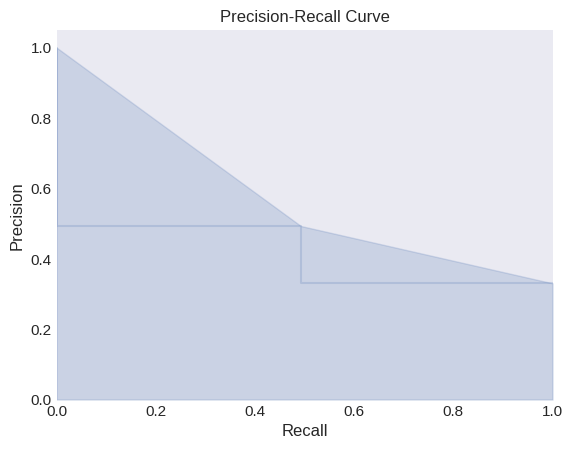

In [222]:
# Assuming y_val_disorder_subclass contains the true values and y_pred_disorder_subclass contains predicted values
precision, recall, _ = precision_recall_curve(y_val_genetic_disorder.values.ravel(), y_pred_genetic_disorder.ravel())

plt.figure()
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.show()

In [223]:
multi_clf.fit(X_train, y_train)

MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=None, ...),
                      n_jobs=-1)

In [224]:
y_pred = multi_clf.predict(X_val)

In [225]:
accuracy_simple_way = accuracy_score(y_val, y_pred)
accuracy_simple_way

0.008312958435207823

In [226]:
accuracy = multi_clf.score(X_val, y_val)
accuracy

0.008312958435207823

In [227]:
precision = precision_score(y_val, y_pred, average=None)
recall = recall_score(y_val, y_pred, average=None)

# Create a DataFrame to display precision and recall for each class
metrics_df = pd.DataFrame({'Precision': precision, 'Recall': recall}, index=y_val.columns)
print(metrics_df)

                                                  Precision    Recall
H/O substance abuse_Not applicable                 0.488987  0.446680
H/O substance abuse_Yes                            0.491589  0.503831
Assisted conception IVF/ART_No                     0.495652  0.509434
Assisted conception IVF/ART_Yes                    0.510891  0.497110
History of anomalies in previous pregnancies_No    0.502508  0.509146
History of anomalies in previous pregnancies_Yes   0.539122  0.532516
Birth defects_Multiple                             0.502439  0.503421
Birth defects_Singular                             0.501961  0.500978
Blood test result_abnormal                         0.262712  0.059160
Blood test result_inconclusive                     0.246753  0.075848
Blood test result_normal                           0.270718  0.097804
Blood test result_slightly abnormal                0.252809  0.086705


In [228]:
y_pred_df =  pd.DataFrame(y_pred, index=y_val.index, columns=y_val.columns)

In [229]:
y_pred_df

,H/O substance abuse_Not applicable,H/O substance abuse_Yes,Assisted conception IVF/ART_No,Assisted conception IVF/ART_Yes,History of anomalies in previous pregnancies_No,History of anomalies in previous pregnancies_Yes,Birth defects_Multiple,Birth defects_Singular,Blood test result_abnormal,Blood test result_inconclusive,Blood test result_normal,Blood test result_slightly abnormal
6277,0,1,1,0,1,0,0,1,0,0,0,0
9661,1,0,1,0,1,0,0,1,0,0,0,0
2709,0,0,1,0,1,0,0,1,1,1,0,0
7938,0,0,0,1,0,1,0,1,0,0,0,0
9602,0,1,1,0,1,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
15784,0,0,0,1,1,0,0,1,0,0,0,0
2914,0,0,1,0,0,1,1,0,0,0,1,0
9949,0,0,1,0,0,1,0,1,0,0,0,0
393,0,0,0,1,1,0,0,1,0,0,0,0


In [230]:
# Real values
y_val_series = pd.get_dummies(y_val.iloc[:, :3]).idxmax(1)
y_val_reverse_df = pd.DataFrame(y_val_series, index=y_val.index, columns=["Genetic Disorder"])
y_val_reverse_df['Genetic Disorder'] = y_val_reverse_df['Genetic Disorder'].str.replace('Genetic Disorder_', '')
y_val_reverse_df

,Genetic Disorder
6277,H/O substance abuse_Not applicable
9661,H/O substance abuse_Yes
2709,H/O substance abuse_Not applicable
7938,Assisted conception IVF/ART_No
9602,H/O substance abuse_Yes
...,...
15784,H/O substance abuse_Not applicable
2914,Assisted conception IVF/ART_No
9949,H/O substance abuse_Not applicable
393,H/O substance abuse_Not applicable


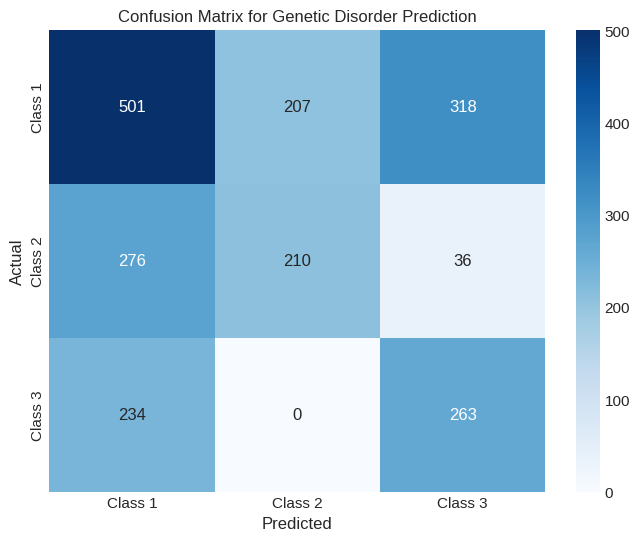

In [231]:
cm_genetic_disorder = confusion_matrix(y_val_genetic_disorder.values.argmax(axis=1), y_pred_genetic_disorder.argmax(axis=1))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_genetic_disorder, annot=True, cmap='Blues', fmt='d', xticklabels=['Class 1', 'Class 2', 'Class 3'], yticklabels=['Class 1', 'Class 2', 'Class 3'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Genetic Disorder Prediction')
plt.show()

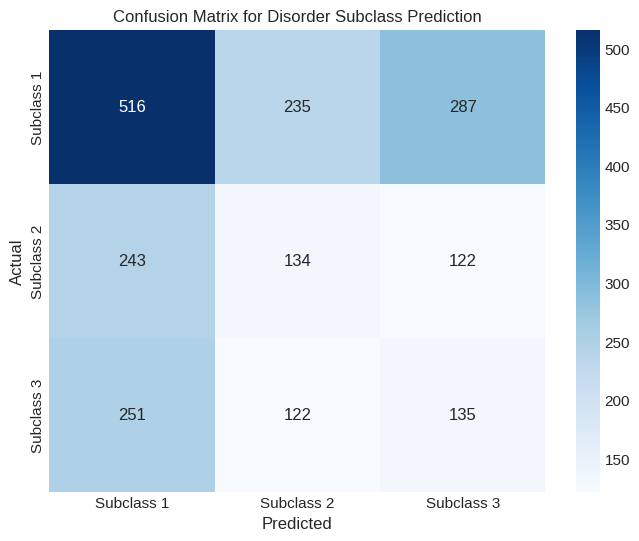

In [232]:
cm_disorder_subclass = confusion_matrix(y_val_disorder_subclass.values.argmax(axis=1), y_pred_disorder_subclass.argmax(axis=1))
plt.figure(figsize=(8, 6))
sns.heatmap(cm_disorder_subclass, annot=True, cmap='Blues', fmt='d', xticklabels=['Subclass 1', 'Subclass 2', 'Subclass 3'], yticklabels=['Subclass 1', 'Subclass 2', 'Subclass 3'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Disorder Subclass Prediction')
plt.show()

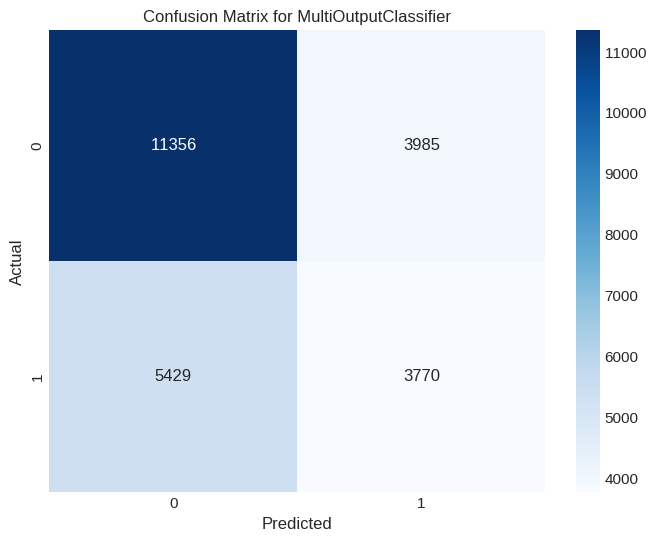

In [233]:
cm_multioutput = confusion_matrix(y_val.values.flatten(), y_pred.flatten())
plt.figure(figsize=(8, 6))
sns.heatmap(cm_multioutput, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for MultiOutputClassifier')
plt.show()